#**Ciencia de Datos Aplicada MINE-4101 - PARCIAL 1**
Univerisdad de los Andes  
Realizado por: Yeimy A. Cano M.

“Al entregar la solución de este parcial, yo, Yeimy A Cano con código 202213304 me comprometo a no conversar durante el desarrollo de este examen con ninguna persona que no sea el profesor del curso, sobre aspectos relacionados con el parcial; tampoco utilizaré algún medio de comunicación por voz, texto o
intercambio de archivos, para consultar o compartir con otros, información sobre el tema del parcial. Soy consciente y acepto las consecuencias que acarreará para mi desempeño académico cometer fraude en este parcial”.

# **0. Importación de librerias de trabajo**

Primero se procede a hacer la importación de librerías para poder trabajar con los datos y poder realizar el análisis.

In [443]:
!pip install --upgrade pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [444]:
!pip install pylev

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [445]:
import numpy as np
import pandas as pd

from pandas_profiling import ProfileReport

import seaborn as sns
from scipy import stats
import scipy
import statsmodels.api as sm

#Entrenamiento del modelo
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures , OneHotEncoder, MinMaxScaler
from sklearn.linear_model import LinearRegression,Lasso, Ridge
from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
%matplotlib inline
plt.rcParams['figure.dpi'] = 110    
import pylev

import itertools

In [446]:
!python --version
print('NumPy', np.__version__)
print('pandas', pd.__version__)
print('SciPy', scipy.__version__)
print('statsmodels', sm.__version__)
print('Matplotlib', mpl.__version__)
print('Seaborn', sns.__version__)


Python 3.7.14
NumPy 1.21.6
pandas 1.3.5
SciPy 1.7.3
statsmodels 0.13.2
Matplotlib 3.2.2
Seaborn 0.11.2


# **Entendimiento del Negocio**




## **a. Objetivos del negocio y situación actual.** 
Inmobiliaria Los Alpes es una inmobiliaria con varios años de trayectoria la cual se especializa en el arrendamiento de inmuebles de corta estancia. La empresa ha ido creciendo poco a poco y en la actualidad enfrenta una serie de retos relacionados con la gran cantidad de competencia que hay en el sector, dificultando la obtención de nuevos inmuebles para su administración como arrendador, así como conseguir los arrendatarios idóneos para el uso de los mismos.

Como estrategia para mantener su competitividad en el mercado, la Inmobiliaria Los Alpes ha decidido enfocarse en determinar los inmuebles que podrían llegar a ser populares desde antes de su publicación. La popularidad de un inmueble está dada en términos de la cantidad de comentarios (reviews) que ha obtenido independientemente de su calificación. Esta actividad es importante dado que los inmuebles más populares son los que generan mayor rotación, mientras que para los de menor popularidad hay que hacer una mayor inversión en marketing para promocionarlos.

La inmobiliaria busca contratar con usted un proyecto de consultoría que tiene como objetivo validar el uso de técnicas de machine learning que apoyen la toma de decisiones del equipo de marketing respecto a los inmuebles para los que deben hacer inversiones en promoción dada su baja popularidad. Le han compartido dos conjuntos de datos: (1) el histórico de sus inmuebles con su respectiva popularidad y (2) los inmuebles que están próximos a publicarse. Adicionalmente, le han compartido el diccionario de datos correspondiente.

# **Entendimiento de los datos**

## **a. Adquisición e integración de datos.**

El archivo de datos está como archivo de CSV, se hace una exploración con una muestra de datos "losalpes_history.csv"

Para trabajar con los datos, éstos se ubican en una ruta de github.

In [447]:
# Loading data historico
url = 'https://raw.githubusercontent.com/yacanom/CDA_MINE-4101_repo/main/Parcial%201/losalpes_history.csv'
data = pd.read_csv(url, sep=',')

In [590]:
# Loading data losalpes_new.csv 
url2 = 'https://raw.githubusercontent.com/yacanom/CDA_MINE-4101_repo/main/Parcial%201/losalpes_new.csv'
dataP = pd.read_csv(url2, sep=',')

## **b. Diccionario de datos.**

De acuerdo a la información entregada, el set de datos cuentan con los siguientes columnas con la respectiva descripción:

| Field | Description| 
| --- | --- |
| id | Identificador del inmueble|
| neighbourhood group| Localidad o distrito en el que se encuentra el inmueble|
| neighbourhood | Barrio en el que se encuentra el inmueble|
| lat, long | Geolocalización del inmueble|
| country | Pais en el que se encuentra el inmueble|
| instant bookable | Indicador de si es posible realizar reserva directamente en la plataforma|
| cancellation_policy| Política de cancelacion de la reserva|
| room type | Tipo de inmueble|
| construction year| Año de construcción del inmueble|
| price | Precio por noche del inmueble|
| service fee | Costo del servicio el cual debe ser cancelado al dejar el inmueble|
| minimum nights | Cantidad mínima de noches que el inmueble puede ser reservado|
| availability 365 | Disponibilidad total en dias durante el ultimo año|
| number of reviews | Total de comentarios del inmueble|
| review rate number | Calificación promedio dada al inmueble|




## **c. Exploración de datos.**

In [449]:
data.head()

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
0,48540006,Manhattan,Hell's Kitchen,40.76212,-73.98820,United States,True,strict,Entire home/apt,2011.0,$ 851,$ 170,4.0,199.0,112.0,1.0
1,35079903,Manhattan,Midtown,40.74623,-73.98499,United States,True,flexible,Hotel room,2021.0,$ 466,$ 93,1.0,161.0,13.0,5.0
2,50681273,Manhattan,Upper West Side,40.78859,-73.97568,United States,False,flexible,Private room,2004.0,$ 874,$ 175,14.0,0.0,1.0,2.0
3,13039267,Manhattan,Financial District,40.70817,-74.00511,United States,False,strict,Private room,2012.0,$ 813,$ 163,1.0,0.0,5.0,3.0
4,8998640,Manhattan,Lower East Side,40.72130,-73.98900,United States,True,moderate,Entire home/apt,2007.0,$ 326,$ 65,4.0,301.0,9.0,3.0


Vamos a hacer una exploración sobre el set de datos históricos, con data.info se puede hacer una ojeada muy superficial para conocer tipos de datos, cantidad, sin tener mucha información detallada que entienda el modelo.

In [450]:
data.shape

(102083, 16)

In [451]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102083 entries, 0 to 102082
Data columns (total 16 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   102083 non-null  int64  
 1   neighbourhood group  101463 non-null  object 
 2   neighbourhood        101476 non-null  object 
 3   lat                  101484 non-null  float64
 4   long                 101484 non-null  float64
 5   country              100967 non-null  object 
 6   instant_bookable     101387 non-null  object 
 7   cancellation_policy  101416 non-null  object 
 8   room type            101492 non-null  object 
 9   construction year    101279 non-null  float64
 10  price                101245 non-null  object 
 11  service fee          101220 non-null  object 
 12  minimum nights       101089 non-null  float64
 13  availability 365     101049 non-null  float64
 14  number of reviews    101313 non-null  float64
 15  review rate numbe

De esta revisión se puede observa que hay datos faltantes, de acuerdo al tamaño del dataframe deberían haber 102083 registros pero solo el id, presenta este numero completo, los demás presentan datos pendientes. 


In [452]:
data.describe()

,id,lat,long,construction year,minimum nights,availability 365,number of reviews,review rate number
count,1.020830e+05,101484.000000,101484.00000,101279.000000,101089.000000,101049.000000,101313.000000,101174.000000
mean,2.914263e+07,40.728070,-73.94981,2012.459454,8.151698,141.075439,27.420479,3.279222
std,1.625930e+07,0.055829,0.04936,7.895321,30.665643,135.463814,49.473778,1.284902
min,1.001254e+06,40.499790,-74.24984,1020.000000,-1223.000000,-10.000000,0.000000,1.000000
25%,1.507753e+07,40.688750,-73.98261,2007.000000,2.000000,3.000000,1.000000,2.000000
50%,2.913163e+07,40.722270,-73.95456,2012.000000,3.000000,96.000000,7.000000,3.000000
75%,4.320009e+07,40.762730,-73.93260,2018.000000,5.000000,268.000000,30.000000,4.000000
max,5.736742e+07,40.916970,-73.70522,2022.000000,5645.000000,3677.000000,1024.000000,5.000000


Ahora usamos ProfileReport para poder hacer la exploración sobre el data set de entrenamiento (train), para no dar la información del dataset completo. 

In [453]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

De acuerdo a la exploración realizada con el reporte, se puede ver que:

 *   En la columna ***id*** se observan que no todos los datos son únicos lo que sugiere se tienen datos duplicados
 *   ***neighbourhood group***: falta el 0.6% de los datos. Hay 3 categorías que predominan los datos.
 *   ***neighbourhood***: falta el 0.6% de los datos
 *   ***lat***: Falta el  0.6% de los datos, así como en ***long***
 *   ***country***: Esta de dos formas diferente el mismo país United States	y United States of America
 *   ***instant_bookable***: falta el 0.7% de los datos
 *   ***cancellation_policy***: falta el 0.7% de los datos
 *   ***room type***: falta el el 0.6% de los datos. Dos categorías predominan: "Entire home/apt" y "Private room"
 *   ***construction year***: Se observa que hay valores atípicos (3), años 1020 y 1022
 *   ***price***: como tiene el carácter "\$" no se tiene cómo número, es mejor quitarlo y pasarlo a numérico. Hay signos de - con lo que se tendrían valores negativos y falta el 0.8% de los datos
 *   ***service fee***: como tiene el carácter "\$" no se tiene cómo número, es mejor quitarlo y pasarlo a numérico, falta el 0.8% de los datos
 *   ***minimum nights***: hay 13 registros como valores negativos, falta el 1% de los datos, aunque el 95percentil está 30, se evidencian valores máximos de 5645.
 *   ***availability 365***: falta el 1% de los datos, hay 428 registros negativos (0.4%), es un tipo de dato sobre los días disponibles en el último año luego el valor máximo debería ser 365, pero se encuentra un máximo de 3677. El 95 percentil es de 365.
 *   ***number of reviews***: falta el 0.8% de los datos. Se observa una desviación estándar del 49.47, así como que el 95 percentil es de 125, pero los 10 valores más altos son superiores a 678.
 *   ***review rate number***: falta el 0.9% de los datos, la mayoría de los datos se distribuye similar del 2.0-5.0 pero son menores los valores de 1.0
 


Revisión de los datos duplicados:

In [454]:
data[data.duplicated()]

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
4084,35568136,Brooklyn,Bedford-Stuyvesant,40.69492,-73.93883,United States,False,flexible,Private room,2022.0,$ 877,$ 175,2.0,335.0,13.0,2.0
6140,20378229,Manhattan,Harlem,40.80624,-73.95622,United States,True,moderate,Private room,2017.0,$ 500,$ 100,1.0,0.0,1.0,3.0
8017,35520638,Brooklyn,Prospect Heights,40.68246,-73.97602,United States,False,flexible,Private room,2017.0,"$ 1,01",$ 201,2.0,118.0,14.0,3.0
10177,6079182,Brooklyn,Park Slope,40.67792,-73.98035,United States,True,moderate,Private room,2015.0,$ 696,$ 139,1.0,129.0,0.0,3.0
12938,35563718,Queens,Sunnyside,40.73445,-73.92222,United States,True,moderate,Entire home/apt,2015.0,$ 772,$ 154,30.0,293.0,55.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101241,35538864,Manhattan,West Village,40.73017,-74.00663,United States,True,moderate,Entire home/apt,2017.0,"$ 1,01",$ 201,5.0,0.0,2.0,3.0
101375,35528923,Brooklyn,East Flatbush,40.65262,-73.95058,United States,False,flexible,Entire home/apt,2005.0,$ 154,$ 31,3.0,0.0,4.0,5.0
101926,35589124,Brooklyn,Gravesend,40.58717,-73.97176,United States,False,flexible,Entire home/apt,2005.0,$ 199,$ 40,30.0,324.0,25.0,5.0
101981,35572002,Manhattan,Hell's Kitchen,40.75413,-73.99398,United States,True,moderate,Private room,2021.0,$ 698,$ 140,1.0,289.0,59.0,3.0


Se identificaron 536 datos duplicados.

Ahora al querer revisar el listado de distritos mas populares:

In [455]:
df_top10 = data[{"neighbourhood group", "neighbourhood"}].groupby("neighbourhood group").count().sort_values("neighbourhood", ascending=False).rename(columns={"neighbourhood":"Total canciones"}).iloc[0:10].reset_index()
df_top10

,neighbourhood group,Total canciones
0,Manhattan,43376
1,Brooklyn,41429
2,Queens,13015
3,Bronx,2666
4,Staten Island,943
5,Broolkyn,7
6,Manhatan,4
7,Quens,4
8,Manattan,1
9,brookln,1


In [456]:
data["neighbourhood group"].unique()

array(['Manhattan', 'Brooklyn', 'Queens', 'Bronx', 'Staten Island', nan,
       'Quens', 'Manattan', 'Broolkyn', 'Manhatan', 'brookln', 'manhatan'],
      dtype=object)

Se evidencia que hay casos de registros en donde quedó mal registrado el districto como en el caso de Quens, que debería ser "Queens".

In [457]:
#Se revisan las coordenadas de los distritos para ver si de esta forma se podrían imputar los distritos faltantes a paritr de las coordenadas
data[data['neighbourhood group'] == 'Manhattan']['lat'].min()

print(f"Manhattan Latitud min y max:%s", data[data['neighbourhood group'] == 'Manhattan']['lat'].min(), data[data['neighbourhood group'] == 'Manhattan']['lat'].max())
print(f"Manhattan Longitud min y max:%s", data[data['neighbourhood group'] == 'Manhattan']['long'].min(), data[data['neighbourhood group'] == 'Manhattan']['long'].max())

print(f"Queens Latitud min y max:%s", data[data['neighbourhood group'] == 'Queens']['lat'].min(), data[data['neighbourhood group'] == 'Queens']['lat'].max())
print(f"Queens Longitud min y max:%s", data[data['neighbourhood group'] == 'Queens']['long'].min(), data[data['neighbourhood group'] == 'Queens']['long'].max())

print(f"Bronx Latitud min y max:%s", data[data['neighbourhood group'] == 'Bronx']['lat'].min(), data[data['neighbourhood group'] == 'Bronx']['lat'].max())
print(f"Bronx Longitud min y max:%s", data[data['neighbourhood group'] == 'Bronx']['long'].min(), data[data['neighbourhood group'] == 'Bronx']['long'].max())

print(f"Staten Island Latitud min y max:%s", data[data['neighbourhood group'] == 'Staten Island']['lat'].min(), data[data['neighbourhood group'] == 'Staten Island']['lat'].max())
print(f"Staten Island Longitud min y max:%s", data[data['neighbourhood group'] == 'Staten Island']['long'].min(), data[data['neighbourhood group'] == 'Staten Island']['long'].max())

Manhattan Latitud min y max:%s 40.70234 40.87821
Manhattan Longitud min y max:%s -74.01851 -73.90855
Queens Latitud min y max:%s 40.56546 40.79721
Queens Longitud min y max:%s -73.95953 -73.70522
Bronx Latitud min y max:%s 40.80011 40.91697
Bronx Longitud min y max:%s -73.93296 -73.78158
Staten Island Latitud min y max:%s 40.49979 40.64816
Staten Island Longitud min y max:%s -74.24984 -74.06092


In [458]:
data[data['neighbourhood group'].isnull() & data['lat'].isnull() ]

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
79,20165041,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109,20541710,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
264,20300907,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
449,28979197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
546,22504032,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100670,20535082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100762,4671922,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
101143,13882077,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
101519,54869917,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Hay 591 casos donde el neighbourhood group no tiene datos, pero tampoco se tienen los valores en las demás columnas, de los cuales no se justifica imputarles valores.

Ahora el top 10 entre los 224 barrios:

In [459]:
df_top10 = data[{"neighbourhood group", "neighbourhood"}].groupby("neighbourhood").count().sort_values("neighbourhood group", ascending=False).rename(columns={"neighbourhood group":"Total sitios"}).iloc[0:10].reset_index()
df_top10

,neighbourhood,Total sitios
0,Bedford-Stuyvesant,7856
1,Williamsburg,7715
2,Harlem,5397
3,Bushwick,4927
4,Hell's Kitchen,3927
5,Upper West Side,3830
6,Upper East Side,3637
7,East Village,3461
8,Midtown,3369
9,Crown Heights,3223


In [460]:
data.loc[:, 'neighbourhood'].sort_values().unique()

array(['Allerton', 'Arden Heights', 'Arrochar', 'Arverne', 'Astoria',
       'Bath Beach', 'Battery Park City', 'Bay Ridge', 'Bay Terrace',
       'Bay Terrace, Staten Island', 'Baychester', 'Bayside', 'Bayswater',
       'Bedford-Stuyvesant', 'Belle Harbor', 'Bellerose', 'Belmont',
       'Bensonhurst', 'Bergen Beach', 'Boerum Hill', 'Borough Park',
       'Breezy Point', 'Briarwood', 'Brighton Beach', 'Bronxdale',
       'Brooklyn Heights', 'Brownsville', "Bull's Head", 'Bushwick',
       'Cambria Heights', 'Canarsie', 'Carroll Gardens', 'Castle Hill',
       'Castleton Corners', 'Chelsea', 'Chelsea, Staten Island',
       'Chinatown', 'City Island', 'Civic Center', 'Claremont Village',
       'Clason Point', 'Clifton', 'Clinton Hill', 'Co-op City',
       'Cobble Hill', 'College Point', 'Columbia St', 'Concord',
       'Concourse', 'Concourse Village', 'Coney Island', 'Corona',
       'Crown Heights', 'Cypress Hills', 'DUMBO', 'Ditmars Steinway',
       'Dongan Hills', 'Douglaston',

Se ven algunos problemas de datos como: "'Bay Terrace, Staten Island'" donde se podría interpretar que el barrio es "Bay Terrace" del distrito de Staten Island, sucede lo mismo con "Chelsea, Staten Island".

In [461]:
data[(data['neighbourhood'] ==  "Bay Terrace, Staten Island") | (data['neighbourhood'] ==  "Chelsea, Staten Island")]

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
3121,24674571,Staten Island,"Bay Terrace, Staten Island",40.55105,-74.13660,United States,False,strict,Entire home/apt,2013.0,$ 59,$ 12,30.0,0.0,2.0,5.0
15141,30348901,Staten Island,"Chelsea, Staten Island",40.59116,-74.18580,United States,False,strict,Entire home/apt,2016.0,"$ 1,04",$ 208,3.0,164.0,31.0,2.0
35374,46461701,Staten Island,"Bay Terrace, Staten Island",40.55182,-74.14439,United States,False,moderate,Entire home/apt,2020.0,$ 800,$ 160,3.0,0.0,1.0,2.0
64075,42683417,Staten Island,"Bay Terrace, Staten Island",40.55105,-74.13660,United States,True,moderate,Entire home/apt,2013.0,$ 59,$ 12,30.0,0.0,2.0,5.0
89820,14890024,Staten Island,"Bay Terrace, Staten Island",40.55182,-74.14439,United States,False,moderate,Entire home/apt,2020.0,$ 800,$ 160,3.0,0.0,1.0,2.0


Se encuentran 4 registros que presentan esa novedad, como son casos puntuales podrían corregirse puntualmente.

Ahora se revisa, si los datos nulos de barrio son diferentes a los vistos con nulos en el distrito:

In [462]:
data[data['neighbourhood'].isnull() & ~data['neighbourhood group'].isnull() ]

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
1481,1318909,Manhattan,NaN,40.79816,-73.96190,United States,True,strict,Entire home/apt,2014.0,$ 892,$ 178,2.0,4.0,45.0,4.0
9839,1345971,Manhattan,NaN,40.75348,-73.97065,United States,False,moderate,Entire home/apt,2019.0,$ 417,$ 83,30.0,272.0,136.0,4.0
16964,1377452,Brooklyn,NaN,40.73783,-73.95259,United States,True,flexible,Private room,2009.0,$ 528,$ 106,3.0,216.0,3.0,2.0
27804,1356465,Brooklyn,NaN,40.68016,-73.94878,United States,False,moderate,Entire home/apt,2015.0,$ 938,$ 188,3.0,408.0,5.0,2.0
44256,1402306,Manhattan,NaN,40.76217,-73.98411,United States,True,moderate,Entire home/apt,2003.0,$ 831,$ 166,5.0,322.0,8.0,3.0
53213,1339896,Manhattan,NaN,40.72709,-73.98274,United States,True,moderate,Private room,2004.0,$ 486,$ 97,1.0,116.0,109.0,2.0
53312,1350942,Manhattan,NaN,40.71693,-73.98948,United States,False,flexible,Entire home/apt,2017.0,"$ 1,15",$ 230,5.0,42.0,8.0,3.0
53515,1426607,Brooklyn,NaN,40.65992,-73.99042,United States,False,strict,Entire home/apt,2007.0,"$ 1,11",$ 222,180.0,163.0,1.0,4.0
56185,1303444,Manhattan,NaN,40.73089,-73.98195,United States,True,strict,Entire home/apt,2013.0,$ 749,$ 150,30.0,67.0,25.0,4.0
66722,1286875,Brooklyn,NaN,40.71580,-73.95803,NaN,NaN,NaN,Entire home/apt,2005.0,NaN,$ 130,6.0,266.0,1.0,5.0


Luego los datos nulos de barrio estarían dentro dos 591 registros completamente sin datos identificados anteriormente. Y quedarían 16 sin datos de barrio.

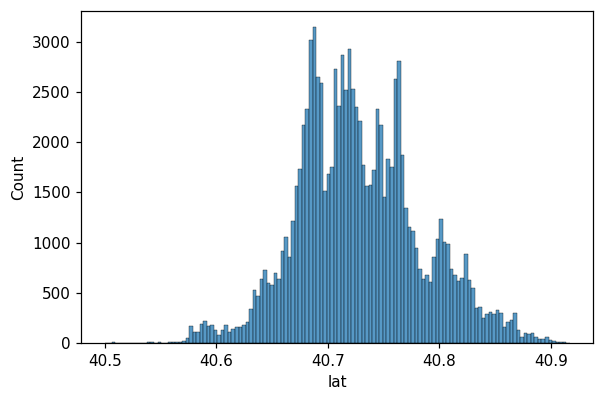

In [463]:
sns.histplot(data=data, x="lat")

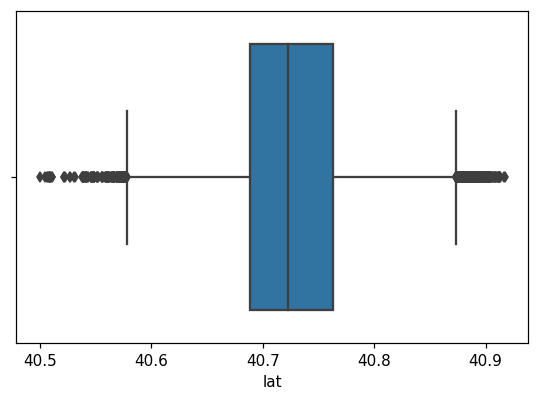

In [464]:
sns.boxplot(x=data["lat"])

Del histograma ybloxplot se puede ver que hay un amplio número de datos de latitud que se concentran en el medio, con algunos valores que se escapan del Q1 y Q3.

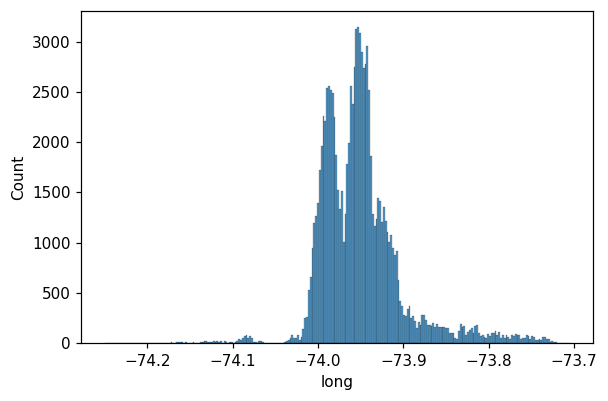

In [465]:
sns.histplot(data=data, x="long")

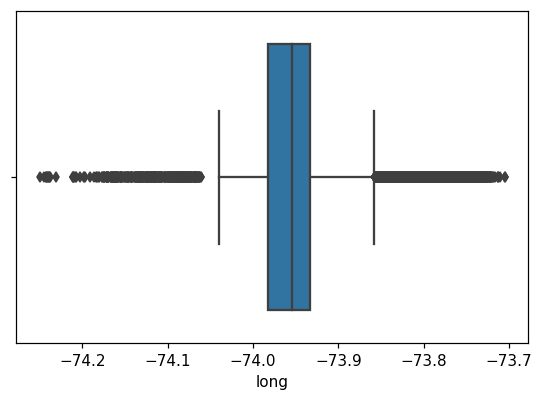

In [466]:
sns.boxplot(x=data["long"])

In [467]:
data.loc[:, {'lat', 'long'}].describe()

,long,lat
count,101484.00000,101484.000000
mean,-73.94981,40.728070
std,0.04936,0.055829
min,-74.24984,40.499790
25%,-73.98261,40.688750
50%,-73.95456,40.722270
75%,-73.93260,40.762730
max,-73.70522,40.916970


In [468]:
#revisando los valores vacíos de lat y long, que no esten en los antes evaluados:
data[ data['lat'].isnull() &  data['long'].isnull() & ~data['neighbourhood'].isnull() ]

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
15698,1545904,Manhattan,Upper West Side,NaN,NaN,United States,True,flexible,Private room,2014.0,$ 413,$ 83,1.0,259.0,25.0,2.0
20771,1512766,Manhattan,Flatiron District,NaN,NaN,United States,False,strict,Private room,2020.0,$ 623,$ 125,21.0,104.0,0.0,2.0
29646,1490122,Brooklyn,Greenpoint,NaN,NaN,United States,True,flexible,Private room,2019.0,$ 524,$ 105,14.0,266.0,22.0,1.0
31995,1431578,Brooklyn,Crown Heights,NaN,NaN,United States,False,strict,Private room,NaN,$ 539,$ 108,1.0,41.0,1.0,2.0
47763,1466925,Queens,Elmhurst,NaN,NaN,United States,True,strict,Private room,2005.0,$ 224,$ 45,1.0,70.0,63.0,3.0
73732,1434892,Brooklyn,Greenpoint,NaN,NaN,United States,False,strict,Entire home/apt,2021.0,"$ 1,06",$ 212,5.0,226.0,14.0,5.0
90504,1442624,Manhattan,East Village,NaN,NaN,United States,False,flexible,Private room,2010.0,$ 506,$ 101,6.0,240.0,1.0,1.0
100878,1450908,Manhattan,West Village,NaN,NaN,United States,True,strict,Entire home/apt,2003.0,$ 381,$ 76,20.0,61.0,157.0,4.0


In [469]:
data[ data['lat'].isnull() &  data['long'].isnull() & ~data['neighbourhood'].isnull() ].count()

id                     8
neighbourhood group    8
neighbourhood          8
lat                    0
long                   0
country                8
instant_bookable       8
cancellation_policy    8
room type              8
construction year      7
price                  8
service fee            8
minimum nights         8
availability 365       8
number of reviews      8
review rate number     8
dtype: int64

Al revisar los datos nulos tanto para long y lat, que contengan datos de las otras varibles, solo se encuentran 8 casos. Es decir que los otros datos nulos estarían dentro de los 591 registros que no tienen valores en las diferentes columas. Aun sin modelar, se podría pensar como hipotesis que las coordenadas geográficas tendrian mas efecto que el barrio o el distrito, por lo que para estos casos dado que lat y long no tienen una varianza muy alta pueden reemplazarse los valores vacios con la media de cada uno.

In [470]:
data['lat'] = data['lat'].fillna(data['lat'].median())

In [471]:
data[ data['long'].isnull() & ~data['neighbourhood'].isnull() ]

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
15698,1545904,Manhattan,Upper West Side,40.72227,NaN,United States,True,flexible,Private room,2014.0,$ 413,$ 83,1.0,259.0,25.0,2.0
20771,1512766,Manhattan,Flatiron District,40.72227,NaN,United States,False,strict,Private room,2020.0,$ 623,$ 125,21.0,104.0,0.0,2.0
29646,1490122,Brooklyn,Greenpoint,40.72227,NaN,United States,True,flexible,Private room,2019.0,$ 524,$ 105,14.0,266.0,22.0,1.0
31995,1431578,Brooklyn,Crown Heights,40.72227,NaN,United States,False,strict,Private room,NaN,$ 539,$ 108,1.0,41.0,1.0,2.0
47763,1466925,Queens,Elmhurst,40.72227,NaN,United States,True,strict,Private room,2005.0,$ 224,$ 45,1.0,70.0,63.0,3.0
73732,1434892,Brooklyn,Greenpoint,40.72227,NaN,United States,False,strict,Entire home/apt,2021.0,"$ 1,06",$ 212,5.0,226.0,14.0,5.0
90504,1442624,Manhattan,East Village,40.72227,NaN,United States,False,flexible,Private room,2010.0,$ 506,$ 101,6.0,240.0,1.0,1.0
100878,1450908,Manhattan,West Village,40.72227,NaN,United States,True,strict,Entire home/apt,2003.0,$ 381,$ 76,20.0,61.0,157.0,4.0


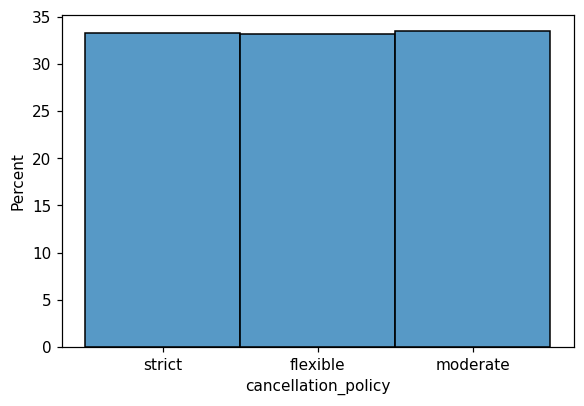

In [472]:
sns.histplot(data=data, x="cancellation_policy", stat="percent")

Respecto a la política de cancelación, se observa que los tres valores esta bien distribuida la data.

In [473]:
#revisando los valores vacíos de room type, que no esten en los antes evaluados:
data[ data['room type'].isnull() & ~data['neighbourhood'].isnull() ]

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number


No se evidencian datosa vacios para "room type" diferente a los 591 registros reportados anteriormente.

Ahora se visualiza un boxplot, de la columna precio:

In [474]:
dfprice = data.copy()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  This is separate from the ipykernel package so we can avoid doing imports until


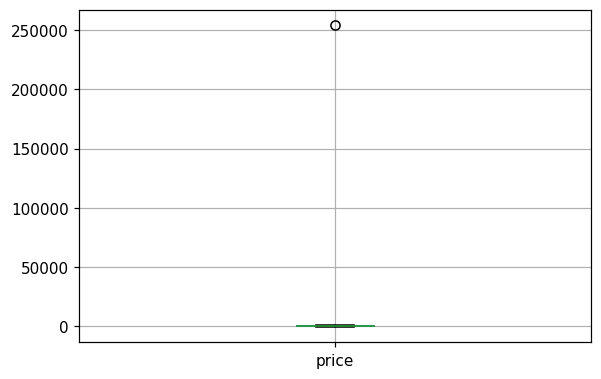

In [475]:
dfprice['price'] = dfprice['price'].str.replace(r'$','')
dfprice['price'] = dfprice['price'].str.replace(',','.')
dfprice['price'] = dfprice['price'].str.replace(r'\t','')
dfprice['price'] = dfprice['price'].astype(float)
boxplot = dfprice.boxplot(column=['price'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  This is separate from the ipykernel package so we can avoid doing imports until


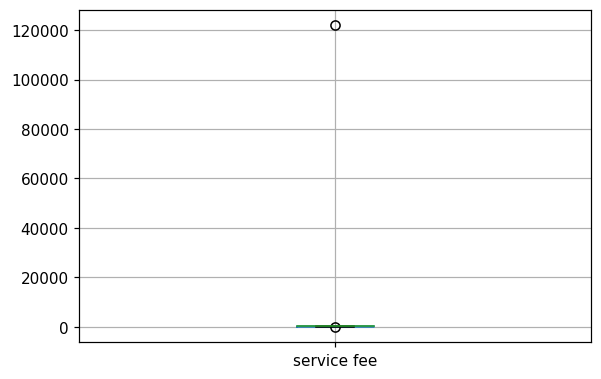

In [476]:
dfprice['service fee'] = dfprice['service fee'].str.replace(r'$','')
dfprice['service fee'] = dfprice['service fee'].str.replace(r',','.')
dfprice['service fee'] = dfprice['service fee'].str.replace(r'\t','')
dfprice['service fee'] = dfprice['service fee'].astype(float)
boxplot = dfprice.boxplot(column=['service fee'])

Se observa que si se manejara *price* y *serve fee* con números hay valores ourliers para ambos, viendo un poco en detalle:


In [477]:
dfprice.loc[:, ['price', 'service fee']].describe()

,price,service fee
count,101245.000000,101220.000000
mean,435.631734,126.190130
std,858.065480,388.772016
min,-611.000000,-193.000000
25%,137.000000,68.000000
50%,427.000000,125.000000
75%,710.000000,182.000000
max,254000.000000,122000.000000


In [478]:
dfprice.loc[:, ['price', 'service fee']].quantile(.95)

price          941.8
service fee    229.0
Name: 0.95, dtype: float64

Ambos presentan valores atípicos como es el caso de los negativos, y de acuerdo al 95 percentil de los datos vemos valores extremos de acuerdo al valor máximo.

In [479]:
data[ data['number of reviews'].isnull() & ~data['review rate number'].isnull() ]

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
18,26674449,Queens,Woodside,40.74434,-73.90347,United States,False,moderate,Private room,2020.0,$ 671,$ 134,30.0,0.0,NaN,4.0
646,9478036,Manhattan,Upper West Side,40.77992,-73.98046,United States,False,moderate,Private room,2009.0,$ 158,$ 32,4.0,265.0,NaN,4.0
934,46073434,Manhattan,Hell's Kitchen,40.76479,-73.98842,United States,False,flexible,Private room,2015.0,"$ 1,02",$ 204,1.0,0.0,NaN,4.0
2251,56944908,Manhattan,Chelsea,40.74089,-74.00002,United States,False,strict,Entire home/apt,2021.0,$ 695,$ 139,2.0,0.0,NaN,1.0
3237,27998865,Brooklyn,Greenpoint,40.72585,-73.94001,United States,True,strict,Private room,2006.0,$ 719,$ 144,6.0,15.0,NaN,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100751,27937559,Manhattan,Murray Hill,40.74604,-73.97228,United States,True,flexible,Entire home/apt,2008.0,$ 387,$ 77,5.0,NaN,NaN,4.0
101023,28272253,Brooklyn,Bedford-Stuyvesant,40.68194,-73.93567,United States,False,flexible,Entire home/apt,2010.0,"$ 1,04",$ 207,30.0,45.0,NaN,4.0
101165,47289599,Brooklyn,Bedford-Stuyvesant,40.68254,-73.94504,United States,True,strict,Private room,2005.0,$ 55,$ 11,5.0,0.0,NaN,2.0
101739,28272805,Brooklyn,Bushwick,40.69982,-73.92321,United States,True,strict,Entire home/apt,2010.0,"$ 1,05",$ 210,30.0,360.0,NaN,4.0


In [480]:
data[ ~data['number of reviews'].isnull() & data['review rate number'].isnull() ]

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
321,1104064,Brooklyn,Bedford-Stuyvesant,40.679920,-73.947500,United States,False,strict,Private room,2015.0,$ 946,$ 189,366.0,332.0,126.0,NaN
999,29622627,Queens,Jamaica,40.682037,-73.796814,United States,False,moderate,Private room,2013.0,"$ 1,02",$ 203,1.0,360.0,10.0,NaN
1104,1150457,Brooklyn,Bedford-Stuyvesant,40.683170,-73.947010,United States,True,strict,Private room,2012.0,$ 343,$ 69,4.0,NaN,18.0,NaN
1670,26902549,Brooklyn,Flatbush,40.649460,-73.960410,United States,False,flexible,Shared room,2006.0,$ 424,$ 85,10.0,341.0,0.0,NaN
1711,41652273,Manhattan,Harlem,40.821650,-73.955930,United States,False,moderate,Private room,2020.0,$ 865,$ 173,5.0,38.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101039,1065955,Brooklyn,Williamsburg,40.719420,-73.957480,United States,True,flexible,Entire home/apt,2003.0,$ 232,$ 46,3.0,169.0,324.0,NaN
101130,33808508,Bronx,Wakefield,40.894020,-73.844370,United States,True,flexible,Entire home/apt,2009.0,$ 139,$ 28,2.0,365.0,27.0,NaN
101466,26937344,Brooklyn,Prospect Heights,40.679770,-73.968820,United States,False,moderate,Entire home/apt,2012.0,$ 724,$ 145,3.0,89.0,1.0,NaN
101543,51266159,Queens,Jamaica,40.679490,-73.798410,United States,True,moderate,Private room,2010.0,$ 620,$ 124,1.0,71.0,392.0,NaN


In [481]:
dfprice['review rate number'].describe()

count    101174.000000
mean          3.279222
std           1.284902
min           1.000000
25%           2.000000
50%           3.000000
75%           4.000000
max           5.000000
Name: review rate number, dtype: float64

In [482]:
dfprice['review rate number'].median()

3.0

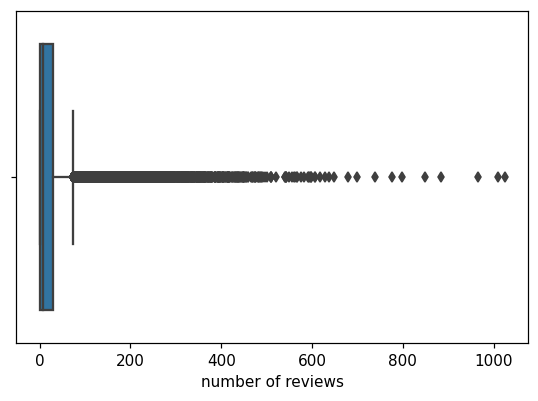

In [630]:
sns.boxplot(x=dfprice["number of reviews"])

In [632]:
dfprice["number of reviews"].describe()

count    101313.000000
mean         27.420479
std          49.473778
min           0.000000
25%           1.000000
50%           7.000000
75%          30.000000
max        1024.000000
Name: number of reviews, dtype: float64

## d. Preparación de los datos

De acuerdo al entendimiento de los datos realizados se crea la función la función **preprocess_quality** que enmarca las diferentes acciones a realizar al dataframe de datos.

1) como se encontraron 536 de 102083 registros como duplicados, serán borrados éstos registros

2) Corregir el nombre de *neighbourhood group*, con la función  fix_neighbourhood_group usando el método levenshtein. Para el caso de los valores faltantes, aplicar buscando por las coordenadas a qué distrito pertenece o si tiene el nombre del barrio, asignar el distrito que le corresponde. Si hay registros que no cumplan alguna de las anteriores el registro se borra.

3) En el caso de *neighbourhood* como la mayoría de registros nulos se borra en el punto 1, los pocos que quedan se les asigna como barrio la moda para esta columna (Bedford-Stuyvesant).

4) Como se evidenció que la mayoría de *nan* de ***lat*** y ***long*** estan en los registros mencionados en el punto 1, para los que si tienen datos en otras columnasse propone imputar el valor con la mediana de cada uno, dado que son variables con poca desviación y que no son más de 20 registros.

5) Para el caso de Country, todos los paises quedaran como "United States". 

6) En el caso de *instant_bookable* que es de tipo boleano False tiene el 50.1% mientras que True el 49.8% (cuando se quitan los registros indicados en 1), dado que los faltantes son el 0.1% se decide colocar los valores faltantes el false.

7) La columna *cancellation_policy* tiene un 0.1% de valores faltantes, es variable categórica de 3 posibles valores para los cuales se tienen: moderate 33.5%, strict 33.2% y flexible 33.2%. Se decide usar la moda para reemplazar los valores faltantes.

8) La columna *construction year* presenta valores negativos, solo 3, y pareciera fue un error de digitación: 1020 y 1022, se actualiza los valores a 2020 y 2022. (sumando 1000). Para los valores faltantes se usará la mediana, ya que la desviación esde 7.

9) Remover el signo $ de las columnas *price* y *service fee*, y que sean valores numéricos, reemplazar los numeros negativos y valores faltantes con la mediana. En ambos casos se identificaron outliers muy superiores al percentil 95, por lo que se ajustan los valores superiores a este un valor ligeramente superior.

10) Para el caso de *minimum nights* que tiene valores negativos, se observa que la mediana es 3 y el Q3 es 5, por lo que se dejará el valor de la mediana.

11) En el caso de *availability 365* tiene valroes superiores a 365 que se espera que sea el máximo, los valores superiores a 365 se igualan a éste valor. Por otra parte para los valores negativos y ausentes se usará la media para imputarlos.

12) En la columna *number of reviews*, dado que es la varaible objetivo se prefiere borrar en vez de imputar por algun valor que realmente pueda no reflejar la popularidad del sitio.

13) En el caso *review rate number* se sugiere reemplazar los valores faltantes con la mediana, que de aceurdo a lo visto es un valor de 3.


In [483]:
def fix_neighbourhood_group(neighbourhood_group):
  if pylev.levenshtein('Manhattan', neighbourhood_group) <= 2:
    return 'Manhattan'
  elif pylev.levenshtein('Brooklyn', neighbourhood_group) <= 2:
    return 'Brooklyn'
  elif pylev.levenshtein('Queens', neighbourhood_group) <= 2:
    return 'Queens'
  elif pylev.levenshtein('Bronx', neighbourhood_group) <= 2:
    return 'Bronx'
  elif pylev.levenshtein('Staten Island', neighbourhood_group) <= 2:
    return 'Staten Island'


def preprocess(df):
  #Eliminar los datos duplicados: 
  df = df.drop_duplicates()

  #Dado los 591 que evidenciaron que solo tenia valores para el índice, se borran aquellos que no tienen valores en el distrito ni en la geolocalización
  df= df.drop(df[df['neighbourhood group'].isnull() & df['lat'].isnull() & df['long'].isnull() ].index)

  #Asignar distrito a partir de los datos de Geolocalización en la columna neighbourhood group, los rangos se tomaron de los min y max de lat y long de los que si tenian datos
  df.loc[ (df['lat'] >= 40.70234) & (df['lat'] <= 40.87821) & (df['long'] >= -74.01851) &  (df['long'] <= -73.90855), ['neighbourhood group'] ] = 'Manhattan'
  df.loc[ (df['lat'] >= 40.56546) & (df['lat'] <= 40.79721) & (df['long'] >= -73.95953) &  (df['long'] <= -73.70522), ['neighbourhood group'] ] = 'Queens'
  df.loc[ (df['lat'] >= 40.80011) & (df['lat'] <= 40.91697) & (df['long'] >= -73.93296) &  (df['long'] <= -73.78158), ['neighbourhood group'] ] = 'Bronx'
  df.loc[ (df['lat'] >= 40.49979) & (df['lat'] <= 40.64816) & (df['long'] >= -74.24984) &  (df['long'] <= -74.06092), ['neighbourhood group'] ] = 'Staten Island'

  #Generar un diccionario con clave barrio y de valor distrito, como otra forma para colocar el nombre del distrito a partir del barrio
  distritos = df.loc[~df['neighbourhood group'].isnull(), ['neighbourhood', 'neighbourhood group']]
  d =  dict([(i,a) for i,a in zip(distritos['neighbourhood'], distritos['neighbourhood group'])])
  df.loc[ (df['neighbourhood group'].isnull() ) , ['neighbourhood group'] ] = df["neighbourhood"].apply(lambda x: d[x])
  
  #Eliminar los registros filas con datos faltantes de distrito (si no quedo corregido en alguno de los pasos anteriores): 
  df = df.dropna(subset=['neighbourhood group'])

  #Corregir el nombre de neighbourhood group con Levenshtein método.
  df['neighbourhood group'] = df['neighbourhood group'].apply(fix_neighbourhood_group)

  #Correccion de los dos barrios "Bay Terrace, Staten Island" "Chelsea, Staten Island"
  df['neighbourhood'] = df['neighbourhood'].apply(lambda x: "Bay Terrace" if (x == "Bay Terrace, Staten Island") else x)
  df['neighbourhood'] = df['neighbourhood'].apply(lambda x: "Chelsea" if (x == "Chelsea, Staten Island") else x)

  #Imputar los valores pendientes de barrio con la moda:
  df['neighbourhood'] = df['neighbourhood'].fillna(pd.Series(df["neighbourhood"].values.flatten()).mode()[0])

  #Asignar los valores de la media en lat y long para los valores vacíos:
  df['lat'] = df['lat'].fillna(df['lat'].median())
  df['long'] = df['long'].fillna(df['long'].median())

  #Ajustar la columna country:
  df['country'] = "United States"

  #Asignar False en instant_bookable para los valores faltantes
  df['instant_bookable'] = df['instant_bookable'].fillna(pd.Series(df["instant_bookable"].values.flatten()).mode()[0])

  #Asignar False en instant_bookable para los valores faltantes
  df['cancellation_policy'] = df['cancellation_policy'].fillna(pd.Series(df["cancellation_policy"].values.flatten()).mode()[0])

  #construction year: tiene valores de los años 1022 y 1021
  df['construction year'] = df['construction year'].apply(lambda x: x+1000 if (x<=1022) else x)
  df['construction year'] = df['construction year'].fillna(df['construction year'].median())
 
  #remover el signo $ de las columnas price y service fee:
  df['price'] = df['price'].str.replace(r'$','')
  df['price'] = df['price'].str.replace(',','.')
  df['price'] = df['price'].str.replace(r'\t','')
  df['price'] = df['price'].astype(float)
  
  df['service fee'] = df['service fee'].str.replace(r'$','')
  df['service fee'] = df['service fee'].str.replace(',','.')
  df['service fee'] = df['service fee'].str.replace(r'\t','')
  df['service fee'] = df['service fee'].astype(float)
  
  #Reemplazar los valores faltantes de: price, service fee con el valor medio
  df['price'] = df['price'].fillna(df['price'].median())
  df['service fee'] = df['service fee'].fillna(df['service fee'].median())

  #valores negativos de price y service fee
  df['price'] = df['price'].apply(lambda x: df['price'].median() if (x<0) else x)
  df['service fee'] = df['service fee'].apply(lambda x: df['service fee'].median() if (x<0) else x)

  #Modificar valores ousider de price: 941 es el 95 percentil, service fee 229.0 es el p95
  df['price'] = df['price'].apply(lambda x: 950 if (x>950) else x)
  df['service fee'] = df['service fee'].apply(lambda x: 250 if (x>250) else x)

  #valores negativos de minimum nights usa 3 que es el de la medina, y lo mismo para los valores faltantes: 
  df['minimum nights'] = df['minimum nights'].apply(lambda x: df['minimum nights'].median() if (x<0) else x)
  df['minimum nights'] = df['minimum nights'].fillna(df['minimum nights'].median())

  #availability 365 valores superiores a 365 se deja con el valor máximo: 365
  df['availability 365'] = df['availability 365'].apply(lambda x: 365 if (x>365) else x)
  #availability 365 valores negativos y faltantes se reemplazan  con la media:
  df['availability 365'] = df['availability 365'].fillna(df['availability 365'].median())
  df['availability 365'] = df['availability 365'].apply(lambda x: df['availability 365'].median() if (x<0) else x)

  #Borrar los registros que no tienen valores en la columna number of reviews
  df = df.dropna(subset=['number of reviews'])

  #pasar review rate number a número
  df['review rate number'] = df['review rate number'].astype(float)
  df['review rate number'] = df['review rate number'].fillna(df['review rate number'].median())

  df.reset_index(drop=True, inplace=True)
  return df

In [484]:
dataH = preprocess(data)
dataH.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:65: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: FutureWarning: The default value of regex will change from True to False in a future version.


(100783, 16)

Luego del preprocesamiento de calidad de datos, se pasa de 102083 a 100783 registros, esto es solo se eliminaron 1.27% de los datos.

In [485]:
ProfileReport(dataH)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Se muestra como quedaron los datos despues de la limpieza de datos

In [486]:
dataH.head(20)

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
0,48540006,Manhattan,Hell's Kitchen,40.76212,-73.98820,United States,True,strict,Entire home/apt,2011.0,851.00,170.0,4.0,199.0,112.0,1.0
1,35079903,Manhattan,Midtown,40.74623,-73.98499,United States,True,flexible,Hotel room,2021.0,466.00,93.0,1.0,161.0,13.0,5.0
2,50681273,Manhattan,Upper West Side,40.78859,-73.97568,United States,False,flexible,Private room,2004.0,874.00,175.0,14.0,0.0,1.0,2.0
3,13039267,Manhattan,Financial District,40.70817,-74.00511,United States,False,strict,Private room,2012.0,813.00,163.0,1.0,0.0,5.0,3.0
4,8998640,Manhattan,Lower East Side,40.72130,-73.98900,United States,True,moderate,Entire home/apt,2007.0,326.00,65.0,4.0,301.0,9.0,3.0
5,1629301,Manhattan,Hell's Kitchen,40.75636,-73.99390,United States,True,strict,Entire home/apt,2022.0,786.00,157.0,30.0,38.0,32.0,3.0
6,2656579,Manhattan,Greenwich Village,40.73236,-73.99920,United States,False,strict,Entire home/apt,2008.0,863.00,173.0,5.0,342.0,13.0,5.0
7,2126371,Manhattan,Morningside Heights,40.80776,-73.96540,United States,True,flexible,Private room,2007.0,749.00,150.0,2.0,166.0,233.0,2.0
8,37291864,Queens,Crown Heights,40.67497,-73.94086,United States,True,moderate,Entire home/apt,2004.0,397.00,79.0,2.0,0.0,46.0,2.0
9,11288476,Manhattan,Upper West Side,40.79371,-73.96708,United States,True,flexible,Entire home/apt,2009.0,462.00,92.0,30.0,250.0,2.0,1.0


Dado que vamos a usar regresión logística, hay que pasar los datos categporicos a numéricos:

In [489]:
def enconderF(df2):
  #Eliminar columna Pais e id: 
  df2 = df2.drop(['country', 'id'], axis=1)

  #instant_bookable to num
  df2['instant_bookable'] = df2['instant_bookable'].replace({
      False: 0,
      True: 1
  })

  #encoder para neighbourhood group
  df2 = pd.get_dummies(df2,columns=['neighbourhood group'],drop_first = True)

  #Dado que el barrio tiene muchas categorias, y que se tienen otros valores de geolocalizacion se quita esta columna
  df2 = df2.drop(['neighbourhood'], axis=1)

  #encoder para cancellation_policy
  df2 = pd.get_dummies(df2,columns=['cancellation_policy'],drop_first = True)
  
  #encoder para room type
  df2 = pd.get_dummies(df2,columns=['room type'],drop_first = True)  

  df2.reset_index(drop=True, inplace=True)
  return df2

In [490]:
dataH=enconderF(dataH)

In [491]:
dataH.shape

(100783, 19)

In [492]:
dataH.head(10)

,lat,long,instant_bookable,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number,neighbourhood group_Brooklyn,neighbourhood group_Manhattan,neighbourhood group_Queens,neighbourhood group_Staten Island,cancellation_policy_moderate,cancellation_policy_strict,room type_Hotel room,room type_Private room,room type_Shared room
0,40.76212,-73.98820,1,2011.0,851.0,170.0,4.0,199.0,112.0,1.0,0,1,0,0,0,1,0,0,0
1,40.74623,-73.98499,1,2021.0,466.0,93.0,1.0,161.0,13.0,5.0,0,1,0,0,0,0,1,0,0
2,40.78859,-73.97568,0,2004.0,874.0,175.0,14.0,0.0,1.0,2.0,0,1,0,0,0,0,0,1,0
3,40.70817,-74.00511,0,2012.0,813.0,163.0,1.0,0.0,5.0,3.0,0,1,0,0,0,1,0,1,0
4,40.72130,-73.98900,1,2007.0,326.0,65.0,4.0,301.0,9.0,3.0,0,1,0,0,1,0,0,0,0
5,40.75636,-73.99390,1,2022.0,786.0,157.0,30.0,38.0,32.0,3.0,0,1,0,0,0,1,0,0,0
6,40.73236,-73.99920,0,2008.0,863.0,173.0,5.0,342.0,13.0,5.0,0,1,0,0,0,1,0,0,0
7,40.80776,-73.96540,1,2007.0,749.0,150.0,2.0,166.0,233.0,2.0,0,1,0,0,0,0,0,1,0
8,40.67497,-73.94086,1,2004.0,397.0,79.0,2.0,0.0,46.0,2.0,0,0,1,0,1,0,0,0,0
9,40.79371,-73.96708,1,2009.0,462.0,92.0,30.0,250.0,2.0,1.0,0,1,0,0,0,0,0,0,0


# **Modelamiento**

Dividimos los datos en: datos de entrenamiento (train) y datos de evaluación (test) con una relación 80% - 20% respectivamente.


In [493]:
train, test = train_test_split(dataH, test_size=0.4, random_state=33)
train.head()

,lat,long,instant_bookable,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number,neighbourhood group_Brooklyn,neighbourhood group_Manhattan,neighbourhood group_Queens,neighbourhood group_Staten Island,cancellation_policy_moderate,cancellation_policy_strict,room type_Hotel room,room type_Private room,room type_Shared room
94486,40.76291,-73.99327,1,2016.0,151.00,30.0,30.0,342.0,3.0,2.0,0,1,0,0,0,0,0,0,0
82662,40.71864,-73.99388,0,2010.0,73.00,15.0,15.0,52.0,13.0,3.0,0,1,0,0,0,0,0,0,0
16601,40.83193,-73.93640,0,2003.0,820.00,164.0,2.0,275.0,0.0,3.0,0,1,0,0,1,0,0,1,0
7181,40.76281,-73.91554,0,2013.0,1.17,234.0,1.0,341.0,2.0,3.0,0,0,1,0,1,0,0,1,0
36366,40.80747,-73.95076,1,2008.0,651.00,130.0,5.0,354.0,121.0,4.0,0,1,0,0,0,0,0,1,0


Para trabajar el problema de regresión, se deben pasar las columnas de categoricas a numericas, como todos los predios estan en Estados Unidos vamos a dejar de disponer de esta columna


In [494]:
#separando la variable objetivo:
x_train = train.drop('number of reviews',axis=1)
y_train = train['number of reviews']

#separando la variable objetivo:
x_test = test.drop('number of reviews',axis=1)
y_test = test['number of reviews']

##a) Primer modelo de regresion lineal

In [495]:
lin_reg = LinearRegression()
lin_reg.fit(x_train, y_train)
lin_reg.intercept_, lin_reg.coef_

(6381.78548264043,
 array([-3.79270302e+00,  8.50127725e+01,  5.63482605e-01,  4.00618853e-02,
         1.28060805e-04,  3.03783694e-03, -6.55514844e-02,  3.59295574e-02,
        -8.06753948e-01,  8.02146554e+00,  3.14008370e+00,  3.73496295e+00,
         2.27710536e+01,  2.73688337e-01, -4.76917146e-01,  4.15589460e+01,
        -6.95486322e-01, -9.20428668e+00]))

In [496]:
y_pred_train = lin_reg.predict(x_train)


In [497]:
y_pred_test = lin_reg.predict(x_test)


In [498]:
#Función para ver los resultados de las métricas de un modelo entrenamiento y validación
def metricsPrint (titulo, X_train, y_train, y_pred_train, X_val, y_val, y_pred_val):
  n,p = X_train.shape

  print('------------ Regresión ', titulo,' con data entrenamiento------------')
  print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
  print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
  print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

  n,p = X_val.shape

  print('------------ Regresión ', titulo, ' con data test ------------')
  print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_val,y_pred_val))
  print("R2-score: %.5f" % r2_score(y_val, y_pred_val) )
  print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_val, y_pred_val))*(n-1)/(n-p-1)) )

In [499]:
metricsPrint ('Regresion Lineal', x_train, y_train, y_pred_train, x_test, y_test, y_pred_test)

------------ Regresión  Regresion Lineal  con data entrenamiento------------
Residual sum of squares (MSE): 2335.63
R2-score: 0.02130
Adj R2-score: 0.02101
------------ Regresión  Regresion Lineal  con data test ------------
Residual sum of squares (MSE): 2500.79
R2-score: 0.02100
Adj R2-score: 0.02057


Con un primer modelo básico de regresión lineal, se observa que el error aumenta un poco con los datos de test, lo que hace que la métrica del R2-score disminuya ligeramente con los datos de test, y la métrica del R2-score no es un gran valor de predicción.



##b) Modelo regresión lineal con normalización de datos

In [500]:
scaler = MinMaxScaler()
scaler.fit(x_train)

columns = x_train.columns
X_train_norm = scaler.fit_transform(x_train)
X_train_norm = pd.DataFrame(X_train_norm,columns=columns)
X_train_norm

,lat,long,instant_bookable,construction year,price,service fee,minimum nights,availability 365,review rate number,neighbourhood group_Brooklyn,neighbourhood group_Manhattan,neighbourhood group_Queens,neighbourhood group_Staten Island,cancellation_policy_moderate,cancellation_policy_strict,room type_Hotel room,room type_Private room,room type_Shared room
0,0.630892,0.465800,1.0,0.684211,0.158061,0.086957,0.005138,0.936986,0.25,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.524745,0.464669,0.0,0.368421,0.075869,0.021739,0.002481,0.142466,0.50,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.796384,0.571275,0.0,0.000000,0.863014,0.669565,0.000177,0.753425,0.50,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,0.630653,0.609963,0.0,0.526316,0.000179,0.973913,0.000000,0.934247,0.50,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.737736,0.544642,1.0,0.263158,0.684932,0.521739,0.000709,0.969863,0.75,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60464,0.541073,0.486479,1.0,0.000000,0.000021,0.847826,0.000177,0.000000,1.00,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
60465,0.435141,0.590990,1.0,0.947368,1.000000,0.800000,0.002303,0.000000,0.50,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
60466,0.535942,0.482418,0.0,0.578947,0.959958,0.747826,0.000177,0.364384,0.25,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
60467,0.626121,0.832561,1.0,0.842105,0.954689,0.743478,0.000000,0.739726,0.50,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [501]:
lin_regN = LinearRegression()
lin_regN.fit(X_train_norm, y_train)

LinearRegression()

In [502]:
y_pred_trainN = lin_regN.predict(X_train_norm)

In [503]:
X_test_norm = scaler.fit_transform(x_test)
X_test_norm = pd.DataFrame(X_test_norm,columns=columns)
X_test_norm

y_pred_testN = lin_regN.predict(X_test_norm)

In [504]:
metricsPrint ('Regresion Lineal', X_train_norm, y_train, y_pred_trainN, X_test_norm, y_test, y_pred_testN)

------------ Regresión  Regresion Lineal  con data entrenamiento------------
Residual sum of squares (MSE): 2335.63
R2-score: 0.02130
Adj R2-score: 0.02101
------------ Regresión  Regresion Lineal  con data test ------------
Residual sum of squares (MSE): 2506.07
R2-score: 0.01894
Adj R2-score: 0.01850


Con este modelo aumenta aumenta el error en test, pero disminuye un poco el sobreajuste, respecto al primer modelo

##c) Modelo Regresión polinomial, p=2

Dada la cantidad de datos, y que la ejecución Polinomial requiere de más ram permitida por el google Colab, se aplica reducción de la dimensionalidad PCA a 10, para poder ejecutar la regresión polinomial con grado 2.

In [505]:
pca = PCA(n_components=10, random_state=32)
pca.fit(x_train)
x_train_PCA = pca.transform(x_train)
x_train_PCA

array([[-2.85295415e+02,  2.01126626e+02, -8.42401465e+01, ...,
         1.57173740e-03, -5.24473155e-01, -1.85146285e-01],
       [-3.63293137e+02, -8.91949212e+01, -9.64261940e+01, ...,
        -1.27163673e-02,  4.75579331e-01, -2.66707671e-01],
       [ 3.88372441e+02,  1.34855665e+02,  2.45919066e+01, ...,
        -7.20890346e-01,  5.22604244e-01,  7.12543180e-01],
       ...,
       [ 4.81227022e+02, -6.97629928e+00,  3.90955203e+01, ...,
         6.90926191e-01,  5.56434232e-01,  6.96121440e-01],
       [ 4.75956533e+02,  1.29982623e+02,  3.83207984e+01, ...,
         2.15710190e-02, -4.81254141e-01,  4.02440898e-01],
       [ 6.80909913e+01,  1.99291000e+02, -2.74611115e+01, ...,
        -7.01109239e-01, -4.78185722e-01,  7.65627633e-01]])

In [506]:
poly_features = PolynomialFeatures(degree=2, include_bias=False)
x_poly_train = poly_features.fit_transform(x_train_PCA)
dataset = pd.DataFrame(x_poly_train)
x_poly_train.shape

(60469, 65)

In [507]:
lin_regP = LinearRegression()
lin_regP.fit(x_poly_train, y_train)

LinearRegression()

In [508]:
y_pred_train = lin_regP.predict(x_poly_train)

In [509]:
x_test_PCA = pca.transform(x_test)
x_poly_test = poly_features.fit_transform(x_test_PCA)
y_pred_test = lin_regP.predict(x_poly_test)

In [510]:
metricsPrint ('Regresion Polinomial P=2', x_poly_train, y_train, y_pred_train, x_poly_test, y_test, y_pred_test)

------------ Regresión  Regresion Polinomial P=2  con data entrenamiento------------
Residual sum of squares (MSE): 2265.93
R2-score: 0.05051
Adj R2-score: 0.04948
------------ Regresión  Regresion Polinomial P=2  con data test ------------
Residual sum of squares (MSE): 2435.28
R2-score: 0.04665
Adj R2-score: 0.04511


##d) Modelo Regresión polinomial, p=3

Ahora se hace regresión polinomial con grado 3, y la reducción de dimensionalidad la dejaremos en 3 (buscando trabajar con una dimensión mas pequeña y evitar el error de ram)

In [511]:
pca = PCA(n_components=3, random_state=32)
pca.fit(x_train)
x_train_PCA = pca.transform(x_train)
x_train_PCA

array([[-285.29541494,  201.12662557,  -84.24014646],
       [-363.29313659,  -89.19492119,  -96.42619396],
       [ 388.3724407 ,  134.85566543,   24.59190656],
       ...,
       [ 481.22702202,   -6.97629928,   39.09552031],
       [ 475.95653274,  129.98262346,   38.32079844],
       [  68.09099129,  199.29100003,  -27.46111153]])

In [512]:
poly_features = PolynomialFeatures(degree=3, include_bias=False)
x_poly_train = poly_features.fit_transform(x_train_PCA)
dataset = pd.DataFrame(x_poly_train)
x_poly_train.shape

(60469, 19)

In [513]:
lin_regP = LinearRegression()
lin_regP.fit(x_poly_train, y_train)

LinearRegression()

In [514]:
y_pred_train = lin_regP.predict(x_poly_train)

In [515]:
x_test_PCA = pca.transform(x_test)
x_poly_test = poly_features.fit_transform(x_test_PCA)
y_pred_test = lin_regP.predict(x_poly_test)

In [516]:
metricsPrint ('Regresion Polinomial P=3', x_poly_train, y_train, y_pred_train, x_poly_test, y_test, y_pred_test)

------------ Regresión  Regresion Polinomial P=3  con data entrenamiento------------
Residual sum of squares (MSE): 2301.42
R2-score: 0.03563
Adj R2-score: 0.03533
------------ Regresión  Regresion Polinomial P=3  con data test ------------
Residual sum of squares (MSE): 2467.82
R2-score: 0.03391
Adj R2-score: 0.03346


##e) Modelo Regresión polinomial y regularización lasso

Dado que el polinomio grado 2 funcionó un poco mejor que grado 3, ahora le vamos a aplicar una regularización lasso para que si restringiendo alguna característica se tiene un mejor valor

In [517]:
pca = PCA(n_components=10, random_state=32)
pca.fit(x_train)
x_train_PCA = pca.transform(x_train)
x_train_PCA

array([[-2.85295415e+02,  2.01126626e+02, -8.42401465e+01, ...,
         1.57173740e-03, -5.24473155e-01, -1.85146285e-01],
       [-3.63293137e+02, -8.91949212e+01, -9.64261940e+01, ...,
        -1.27163673e-02,  4.75579331e-01, -2.66707671e-01],
       [ 3.88372441e+02,  1.34855665e+02,  2.45919066e+01, ...,
        -7.20890346e-01,  5.22604244e-01,  7.12543180e-01],
       ...,
       [ 4.81227022e+02, -6.97629928e+00,  3.90955203e+01, ...,
         6.90926191e-01,  5.56434232e-01,  6.96121440e-01],
       [ 4.75956533e+02,  1.29982623e+02,  3.83207984e+01, ...,
         2.15710190e-02, -4.81254141e-01,  4.02440898e-01],
       [ 6.80909913e+01,  1.99291000e+02, -2.74611115e+01, ...,
        -7.01109239e-01, -4.78185722e-01,  7.65627633e-01]])

In [518]:
poly_features = PolynomialFeatures(degree=2, include_bias=False)
x_poly_train = poly_features.fit_transform(x_train_PCA)
dataset = pd.DataFrame(x_poly_train)
x_poly_train.shape

(60469, 65)

In [519]:
x_test_PCA = pca.transform(x_test)
x_poly_test = poly_features.fit_transform(x_test_PCA)

Se decide un alfa de 35 como hiperparámetro de la regularización Lasso

In [520]:
LassoModel = Lasso(alpha=35)
LassoModel.fit(x_poly_train, y_train)

Lasso(alpha=35)

In [521]:
y_pred_lass_train_1 = LassoModel.predict(x_poly_train)
y_pred_lass_train_1

array([20.89584041, 26.64615928, 36.77282934, ..., 37.2157436 ,
       40.20701751, 28.45800649])

In [522]:
y_pred_lass_test_1 = LassoModel.predict(x_poly_test)


In [530]:
metricsPrint ('Regresion Lasso alfa = 35', x_poly_train, y_train, y_pred_lass_train_1, x_poly_test, y_test, y_pred_lass_test_1)

------------ Regresión  Regresion Lasso alfa = 35  con data entrenamiento------------
Residual sum of squares (MSE): 2290.17
R2-score: 0.04035
Adj R2-score: 0.03932
------------ Regresión  Regresion Lasso alfa = 35  con data test ------------
Residual sum of squares (MSE): 2455.68
R2-score: 0.03866
Adj R2-score: 0.03711


## Comparación de modelos:

In [533]:
columnas = ['a.Reglineal', 'b.Reg linealyMinMaxScaller',	'c.RegPoli(2)_PCA=10', 'd.RegPoli(3)_PCA=3', 'e.Regpoli(2)_Lasso'] # definimos los nombres de las columnas
filas = ['MSE Train', 'MSE Test', 'R2-score Train', 'R2-score Test'] # definimos los nombres de las filas

datos = [
        ['2335.63',	'2335.63',	'2265.93',	'2301.42',	'2290.17'],
        ['2500.79',	'2506.07',	'2435.28',	'2467.82',	'2455.68' ],
        ['2.130%',	'2.130%',	'5.051%',	'3.563%',	'4.035%' ],
        ['2.100%',	'1.894%',	'4.665%',	'3.391%',	'3.866%']
        ]


table = pd.DataFrame(datos, columns=columnas, index=filas)

table.head(4)

,a.Reglineal,b.Reg linealyMinMaxScaller,c.RegPoli(2)_PCA=10,d.RegPoli(3)_PCA=3,e.Regpoli(2)_Lasso
MSE Train,2335.63,2335.63,2265.93,2301.42,2290.17
MSE Test,2500.79,2506.07,2435.28,2467.82,2455.68
R2-score Train,2.130%,2.130%,5.051%,3.563%,4.035%
R2-score Test,2.100%,1.894%,4.665%,3.391%,3.866%


De acuerdo a las comparaciones de las métricas, aunque ninguno tiene una valore de predicción aceptable, de los modelos revisados el mejor fue el c) de regresión polinomial grado 2 y PCA de 10. Por su metrica con data de evaluación del 4.665% que es la mas alta no es suficiente para el uso en la imobiliaria para ello se esperaría un modelo de almenos el 60%, y dado que es un valor muy pequeño no se considera pueda responder adecuadamente al objetivo planteado.

# **Estimación de los datos con el modelo seleccionado**

In [613]:
pca = PCA(n_components=10, random_state=32)
pca.fit(x_train)
x_train_PCA = pca.transform(x_train)

poly_features = PolynomialFeatures(degree=2, include_bias=False)
x_poly_train = poly_features.fit_transform(x_train_PCA)
dataset = pd.DataFrame(x_poly_train)

lin_regP = LinearRegression()
lin_regP.fit(x_poly_train, y_train)

LinearRegression()

In [614]:
x_train_PCA.shape

(60469, 10)

Se aplica las funciones de preprocesamiento a los datos de los inmuebles que están próximos a publicarse, para el caso de las columnas innexistentes se colo como numero de reviews 7  y como review rate number 3 que son los datos de la mediana vista en los historicos (esto para que las funciones no fallen, y en adición la cantidad de reviews igual luego se quita dado que es la variable a predecir)

In [615]:
dataP2 = dataP.copy()
dataP2['number of reviews']=7
dataP2['review rate number']=3
dataPRED = preprocess(dataP2)
dataPRED.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:63: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:65: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: FutureWarning: The default value of regex will change from True to False in a future version.


(512, 16)

In [616]:
dataPRED.head(10)

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
0,27883434,Queens,Ozone Park,40.68432,-73.85862,United States,False,moderate,Private room,2006.0,519.00,104.0,1.0,89.0,7,3.0
1,55448727,Manhattan,Civic Center,40.71317,-74.00654,United States,False,moderate,Entire home/apt,2006.0,950.00,197.0,2.0,42.0,7,3.0
2,56858749,Queens,East Elmhurst,40.76441,-73.88943,United States,True,flexible,Private room,2018.0,950.00,200.0,2.0,0.0,7,3.0
3,39029953,Manhattan,Gramercy,40.73442,-73.98383,United States,True,strict,Private room,2011.0,497.00,99.0,4.0,0.0,7,3.0
4,5567200,Manhattan,Upper West Side,40.79660,-73.97154,United States,True,strict,Entire home/apt,2022.0,820.00,164.0,4.0,365.0,7,3.0
5,18931756,Manhattan,Chelsea,40.74222,-73.99444,United States,False,flexible,Entire home/apt,2012.0,1.11,221.0,29.0,220.0,7,3.0
6,19445947,Queens,Williamsburg,40.71640,-73.95438,United States,True,moderate,Entire home/apt,2014.0,913.00,183.0,7.0,0.0,7,3.0
7,17607892,Queens,Jackson Heights,40.74879,-73.88342,United States,False,flexible,Private room,2008.0,238.00,48.0,1.0,5.0,7,3.0
8,46760496,Manhattan,Midtown,40.75287,-73.97352,United States,True,moderate,Private room,2006.0,930.00,186.0,3.0,357.0,7,3.0
9,8196700,Manhattan,Midtown,40.74673,-73.98667,United States,False,strict,Private room,2021.0,950.00,197.0,1.0,70.0,7,3.0


In [617]:
dataPRED_enc=enconderF(dataPRED)

In [618]:
dataPRED_enc = dataPRED_enc.drop('number of reviews',axis=1)


In [619]:
x_PRED_PCA = pca.transform(dataPRED_enc)

In [620]:
x_poly_PRED = poly_features.fit_transform(x_PRED_PCA)

In [621]:
y_PRED = lin_regP.predict(x_poly_PRED)

In [622]:
y_PRED.size

512

In [625]:
dataPRED = dataPRED.drop('review rate number',axis=1)

Se adiciona la columna 'number of reviews' con los datos de la predicción del modelo:

In [623]:
dataPRED['number of reviews']=y_PRED

In [626]:
dataPRED

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews
0,27883434,Queens,Ozone Park,40.68432,-73.85862,United States,False,moderate,Private room,2006.0,519.00,104.0,1.0,89.0,32.362299
1,55448727,Manhattan,Civic Center,40.71317,-74.00654,United States,False,moderate,Entire home/apt,2006.0,950.00,197.0,2.0,42.0,18.651370
2,56858749,Queens,East Elmhurst,40.76441,-73.88943,United States,True,flexible,Private room,2018.0,950.00,200.0,2.0,0.0,13.632221
3,39029953,Manhattan,Gramercy,40.73442,-73.98383,United States,True,strict,Private room,2011.0,497.00,99.0,4.0,0.0,18.023355
4,5567200,Manhattan,Upper West Side,40.79660,-73.97154,United States,True,strict,Entire home/apt,2022.0,820.00,164.0,4.0,365.0,16.265035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507,14305691,Queens,Bedford-Stuyvesant,40.69232,-73.93446,United States,False,moderate,Private room,2014.0,103.00,21.0,2.0,0.0,13.266489
508,21955046,Queens,Bedford-Stuyvesant,40.69122,-73.93753,United States,True,moderate,Private room,2008.0,110.00,22.0,2.0,21.0,17.818030
509,35125192,Queens,Williamsburg,40.71896,-73.94270,United States,False,strict,Entire home/apt,2022.0,251.00,50.0,30.0,335.0,29.989369
510,46665500,Brooklyn,Fort Greene,40.68531,-73.97451,United States,True,strict,Private room,2022.0,1.01,201.0,1.0,41.0,26.230234


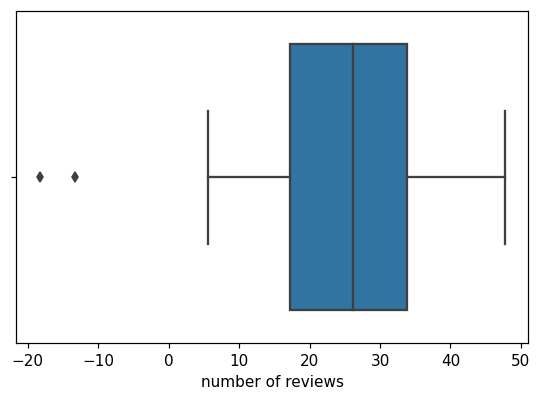

In [627]:
sns.boxplot(x=dataPRED["number of reviews"])

In [629]:
dataPRED["number of reviews"].describe()

count    512.000000
mean      25.938070
std       10.486011
min      -18.296706
25%       17.295370
50%       26.112665
75%       33.828690
max       47.676799
Name: number of reviews, dtype: float64

Dentro de lo visto se considera no popular si su número de reviews no supera la media (en este caso 25, en el caso del histórico era del 27)


In [633]:
dataPRED['costo publicidad'] = dataPRED['price'].apply(lambda x: x*0.02)

In [635]:
dataPRED['costo publicidad'] = dataPRED["number of reviews"].apply(lambda x: 0 if (x >= 25) else x)
dataPRED

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,costo publicidad
0,27883434,Queens,Ozone Park,40.68432,-73.85862,United States,False,moderate,Private room,2006.0,519.00,104.0,1.0,89.0,32.362299,0.000000
1,55448727,Manhattan,Civic Center,40.71317,-74.00654,United States,False,moderate,Entire home/apt,2006.0,950.00,197.0,2.0,42.0,18.651370,18.651370
2,56858749,Queens,East Elmhurst,40.76441,-73.88943,United States,True,flexible,Private room,2018.0,950.00,200.0,2.0,0.0,13.632221,13.632221
3,39029953,Manhattan,Gramercy,40.73442,-73.98383,United States,True,strict,Private room,2011.0,497.00,99.0,4.0,0.0,18.023355,18.023355
4,5567200,Manhattan,Upper West Side,40.79660,-73.97154,United States,True,strict,Entire home/apt,2022.0,820.00,164.0,4.0,365.0,16.265035,16.265035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507,14305691,Queens,Bedford-Stuyvesant,40.69232,-73.93446,United States,False,moderate,Private room,2014.0,103.00,21.0,2.0,0.0,13.266489,13.266489
508,21955046,Queens,Bedford-Stuyvesant,40.69122,-73.93753,United States,True,moderate,Private room,2008.0,110.00,22.0,2.0,21.0,17.818030,17.818030
509,35125192,Queens,Williamsburg,40.71896,-73.94270,United States,False,strict,Entire home/apt,2022.0,251.00,50.0,30.0,335.0,29.989369,0.000000
510,46665500,Brooklyn,Fort Greene,40.68531,-73.97451,United States,True,strict,Private room,2022.0,1.01,201.0,1.0,41.0,26.230234,0.000000
